In [1]:
import os, sys
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib
import matplotlib.pyplot as plt
import yaml

from getdist import loadMCSamples, plots, mcsamples, MCSamples
from python_scripts.prior import *

# Define chain folder
chain_dir = os.path.join(os.getcwd(), 'chains')

### Prior Distributions
In order to determine which set of parameters is best-constrained by the data, we need to build the prior distributions associated to the parameters. __Where__ can we find the prior distributions on the parameters? The `.param` file contains only the connection to the likelihood folder and, for each parameter, an array containing values that represent arbitrary guesses about the final posterior's mean, standard deviation and physical boundaries.

The information concerning the prior distribution can be found directly inside the __likelihood__ folder: if no prior information is available, Monte Python uses a flat borderless prior as default.

#### Prior Sampling using Monte Python
From the previous explanation, it is clear that having a prior folder lets you sample from the original distribution directly with Monte Python. However if we do not have any information for some parameters, meaning that their priors will be flat and borderless, we can follow these steps:
1. Create a new likelihood folder for each parameter containing the prior information; leave the `.data` file blank if the prior is flat.
2. Copy the `.param` file, replace the original `data.experiments` array with the list of likelihoods we have just created. 

*Remember also to modify also the original* `.param` *file in order to correctly include the prior distributions during the posterior sampling!*

__NOTE__: this method is *very* slow even for just one parameter since it relies on the Metropolis-Hastings algorithm for sampling. If you're looking for a practical example take a look at the third notebook. This is a realistic result for a prior on $\omega_b$:

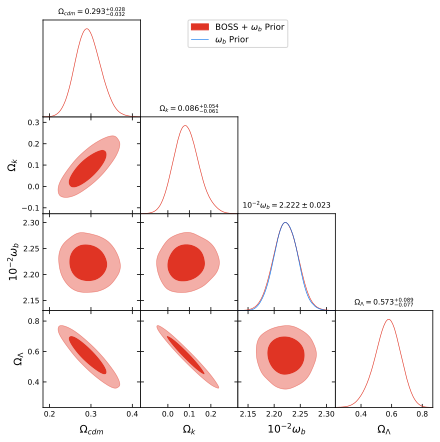

In [2]:
omega_b_prior = loadMCSamples(file_root=chain_dir+'/omega_b_prior/2023-10-10_10000_', settings={'ignore_rows':0})
omega_b_prior.name_tag = '$\omega_b$ Prior'
posterior = loadMCSamples(file_root=chain_dir+'/lc_bao_omega_b/2023-10-10_10000_', settings={'ignore_rows':0.3})
posterior.name_tag = 'BOSS $+$ $\omega_b$ Prior'

# Given values: 0.02222 +- 0.00023
g = plots.get_subplot_plotter(width_inch=7)
g.settings.alpha_filled_add=0.3
g.triangle_plot([posterior, omega_b_prior], posterior.getParamNames().list(), filled=True, title_limit=1)

#### Prior Sampling using SciPy
This method simply consists in taking the desired prior distribution from the `.param` file and sample from it using SciPy.

__'*Cosmological*' Parameters__\
The prior of these parameters is fixed before sampling. In particular, MontePython takes a flat borderless prior as default. However, to find the best-constrained set of parameters, we need to define precise border limits for the so-called "cosmological" parameters: thanks to the `priorChain()` class inside the `prior.py` module it is possible to define such borders and build the prior chains by modifying the original input `.param` file. You simply need to add a *commented* line (first char must be '#') with the following structure:

    #data.prior['par_name'] = ['flat']
or

    #data.prior['par_name'] = ['gaussian', gaus_mean, gaus_sigma]

The prior will be computed by default to fit in the range associated to the corresponding parameter's array: 

    data.parameters['par_name']      = [ mean, low, high, sigma, scale, 'cosmo']

__'*Derived*' Parameters__\
To mathematically derive the prior distribution of a parameter that is a function of other parameters with known prior distributions, we can use the concept of change of variables in probability theory. If we have a derived parameter, let's call it $Y$, which is a function of other parameters $X_1, X_2, \ldots, X_n$, and we know the prior distributions of these ones (as it is indeed in our case) we can find the prior distribution of $Y$ using the following relation:

$$
p_Y(y) = \int p_X(x_1, x_2, \ldots, x_n) \, \delta(y - f(x_1, x_2, \ldots, x_n)) \, dx_1 \, dx_2 \, \ldots \, dx_n
$$

where:

- $p_Y(y)$ is the probability density function (PDF) of the derived parameter $Y$, which is what you want to find.
- $p_X(x_1, x_2, \ldots, x_n)$ represents the joint prior distribution of the input parameters $X_1, X_2, \ldots, X_n$.
- $f(x_1, x_2, \ldots, x_n)$ is the function that expresses how $Y$ is derived from the input parameters.
- $\delta(y - f(x_1, x_2, \ldots, x_n))$ is the *Dirac* delta function, which enforces the constraint that $y$ must equal $f(x_1, x_2, \ldots, x_n)$.

The integral on the right-hand side of the equation is taken over all possible values of $X_i$ that satisfy the constraint $y = f(x_1, x_2, \ldots, x_n)$.

GetDist's method `MCSamples.addDerived()` computes derived parameters' distributions taking as arguments the functional relation $f$, the name and label of the new variable.\
However, some derived parameters are sampled during cosmological simulations: building these parameters' prior distributions ($sigma_8$ in our case) requires using the CLASS engine and much more computational effort.

Cosmological parameters example:

In [3]:
# Initialize the prior chains
prior = priorChain(root_dir=chain_dir+'/lc_bao_omega_b', chain_name='/2023-10-10_10000_')

In [4]:
# Getting only the cosmological parameters' prior distributions
cosmo_prior = prior.get_cosmo_prior()
cosmo_prior.name_tag = 'BOSS Prior'

Removed 0.3 as burn in


Fixed Parameter Limits: {'Omega_cdm': (0.0, 1.0), 'Omega_k': (-0.5, 0.5)}


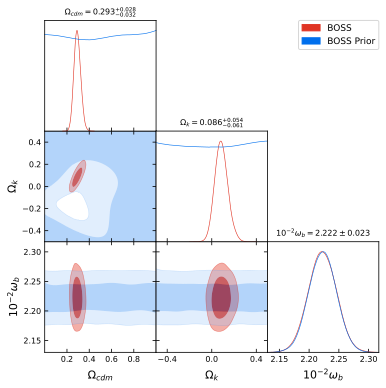

In [5]:
# Getting the full posterior chains
posterior = loadMCSamples(file_root=chain_dir+'/lc_bao_omega_b/2023-10-10_10000_', settings={'ignore_rows':0.3})
posterior.name_tag = 'BOSS'

g = plots.get_subplot_plotter(width_inch=6)
g.settings.alpha_filled_add = 0.3
# Get prior boundaries for plotting
g.triangle_plot([posterior, cosmo_prior], cosmo_prior.getParamNames().list(), title_limit=1, 
                filled=True,
                param_limits=prior.get_param_limits())

Derived parameters example (not including $\sigma_8$ due to execution time):

Prior samples successfully loaded.
Fixed Parameter Limits: {'Omega_cdm': (0.0, 1.0), 'Omega_k': (-0.5, 0.5)}


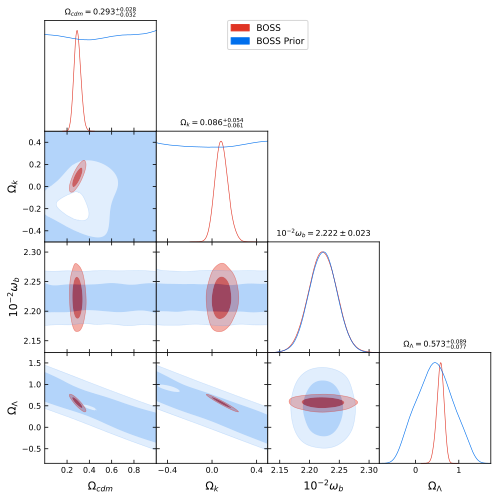

In [6]:
# Computing prior distributions of Monte Python's derived parameters
full_prior = prior.get_dv_prior()
full_prior.name_tag = 'BOSS Prior'

# Plot both the cosmologic and derived parameters
# Remember that we can add more derived parameters directly using GetDist
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
g.triangle_plot([posterior, full_prior], full_prior.getParamNames().list(), title_limit=1,
                filled=True,
                param_limits=prior.get_param_limits());

Now let's continue with the __main__ dataset, obtained with PyBird's EFT predictions.

In [7]:
prior = priorChain(root_dir=chain_dir+'/lcdm_eftboss', chain_name='/2023-10-12_10000_')
cosmo_prior = prior.get_cosmo_prior()
cosmo_prior.name_tag = 'BOSS Prior'
cosmo_names = cosmo_prior.getParamNames().list()

Removed 0.3 as burn in


In the following cell we changed 2 settings inside the `loadMCSamples()` functions, both modifying the smoothing bandwidth of the parameters. You can see that, by increasing the original value of $-1$ (automatic bandwidth smoothing) we obtain very non-smooth posterior distributions. At the same time, however, these distributions fit inside the prior range.

In [8]:
posterior = loadMCSamples(file_root=chain_dir+'/lcdm_eftboss/2023-10-12_10000_',
                          settings={'ignore_rows':0.3, 'smooth_scale_1D':0.1, 'smooth_scale_2D':0.2})
posterior.name_tag = 'BOSS'

In [9]:
p = posterior.getParams()
# Check that the chains fit inside the prior range - this function is also included in the prior class
def range_check(posterior, prior):
    p = posterior.getParams()
    params = prior.get_params()
    param_list = []
    for name in cosmo_names:
        method = getattr(p, name)
        #print(f'{name} chain = [{method.min():.4}-{method.max():.4}]')
        #print(f'{name} range = [{params[name][1]:.4}-{params[name][2]:.4}]')
        if (params[name][1] <= method.min()) & (params[name][2] > method.max()):
            #print('INSIDE the prior range.\n')
            pass
        else:
            param_list.append([name])
            #print('OUTSIDE the prior range.\n')
            
    if not len(param_list):
        return print('Chains generated by Monte Python respect the prior ranges.')
    else:
        return print('The following parameters exceed the prior range:', param_list)

range_check(posterior, prior)

Chains generated by Monte Python respect the prior ranges.


Fixed Parameter Limits: {'omega_b': (2.068, 2.468), 'omega_cdm': (0.08, 0.16), 'h': (0.635, 0.715), 'ln10^{10}A_s': (2.644, 3.444), 'n_s': (0.765, 1.165), 'b1_hN': (0.0, 4.0), 'c2_hN': (-10.0, 10.0), 'b1_hS': (0.0, 4.0), 'c2_hS': (-10.0, 10.0), 'b1_lN': (0.0, 4.0), 'c2_lN': (-10.0, 10.0), 'b1_lS': (0.0, 4.0), 'c2_lS': (-10.0, 10.0)}


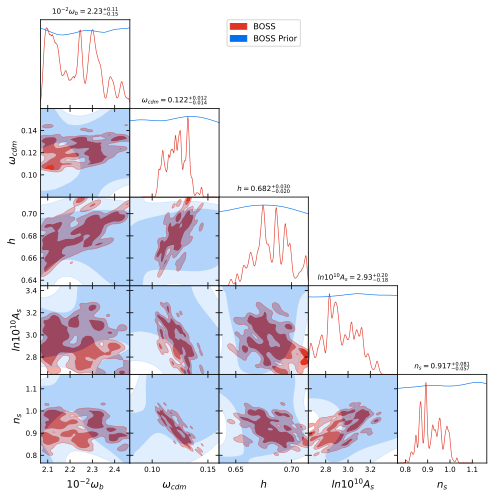

In [10]:
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
g.triangle_plot([posterior, cosmo_prior], cosmo_prior.getParamNames().list(), title_limit=1,
                filled=True,
                param_limits=prior.get_param_limits());

Let's try with automatic smoothing. We can notice here that the chains fit inside the prior ranges. However, although the automatic smoothing produces well-smoothed curves in the triangular plot, it seems that the posteriors outrange the prior boundaries.

In [11]:
posterior = loadMCSamples(file_root=chain_dir+'/lcdm_eftboss/2023-10-12_10000_', 
                          settings={'ignore_rows':0.3, 'smooth_scale_1D':-1, 'smooth_scale_2D':-1})
posterior.name_tag = 'BOSS'

In [12]:
range_check(posterior, prior)

Chains generated by Monte Python respect the prior ranges.


Fixed Parameter Limits: {'omega_b': (2.068, 2.468), 'omega_cdm': (0.08, 0.16), 'h': (0.635, 0.715), 'ln10^{10}A_s': (2.644, 3.444), 'n_s': (0.765, 1.165), 'b1_hN': (0.0, 4.0), 'c2_hN': (-10.0, 10.0), 'b1_hS': (0.0, 4.0), 'c2_hS': (-10.0, 10.0), 'b1_lN': (0.0, 4.0), 'c2_lN': (-10.0, 10.0), 'b1_lS': (0.0, 4.0), 'c2_lS': (-10.0, 10.0)}


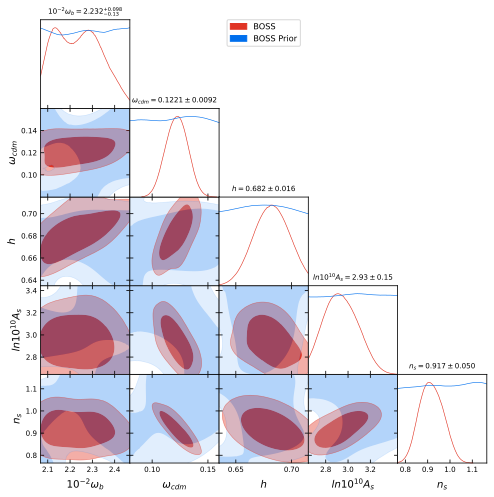

In [13]:
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
g.triangle_plot([posterior, cosmo_prior], cosmo_prior.getParamNames().list(), title_limit=1,
                filled=True, 
                param_limits=prior.get_param_limits());

The issue seems to be related to the total number of points, since other runs with more samples did not raise any warning message.

Now add the derived and nuisance parameters to the prior distribution and plot everything together before analyzing the results using Tensiometer. The derived parameters' prior distributions rely on the cosmologic ones, therefore calling the `.get_dv_prior()` method will automatically run `.get_cosmo_prior()` unless you have already done it.\
For the *nuisance* parameters, the `.get_nuisance_prior()` method outputs an independent prior chain: you can join the *derived+cosmo* prior by calling `.get_dv_prior()` to the nuisance prior using GetDist.

In [14]:
# This cell is just a demo of the .get_dv_prior() method including CLASS computation
# The full run would take approximately 1h: if you wish to reproduce it, just change
# include_class = True and save the chain using GetDist
prior = priorChain(root_dir=chain_dir+'/lcdm_eftboss', chain_name='/2023-10-12_10000_')
cosmo_prior = prior.get_dv_prior(include_class=False)
#cosmo_prior.saveAsText(root='')

Running get_cosmo_prior() sampling.
Removed 0.3 as burn in
Prior samples successfully loaded.


In [15]:
cosmo_prior = loadMCSamples(file_root=chain_dir+'/lcdm_eftboss/2023-10-12_10000_cosmo_prior_', 
                          settings={'ignore_rows':0., 'smooth_scale_1D':-1, 'smooth_scale_2D':-1})
cosmo_prior.name_tag = 'BOSS Prior'
# Check completeness
print(f'List of \"cosmological\" parameters: {cosmo_prior.getParamNames().getRunningNames()}')
print(f'     List of \"derived\" parameters: {cosmo_prior.getParamNames().getDerivedNames()}')

List of "cosmological" parameters: ['omega_b', 'omega_cdm', 'h', 'ln10^{10}A_s', 'n_s']
     List of "derived" parameters: ['Omega_m', 'A_s', 'sigma8']


Fixed Parameter Limits: {'omega_b': (2.068, 2.468), 'omega_cdm': (0.08, 0.16), 'h': (0.635, 0.715), 'ln10^{10}A_s': (2.644, 3.444), 'n_s': (0.765, 1.165), 'b1_hN': (0.0, 4.0), 'c2_hN': (-10.0, 10.0), 'b1_hS': (0.0, 4.0), 'c2_hS': (-10.0, 10.0), 'b1_lN': (0.0, 4.0), 'c2_lN': (-10.0, 10.0), 'b1_lS': (0.0, 4.0), 'c2_lS': (-10.0, 10.0)}


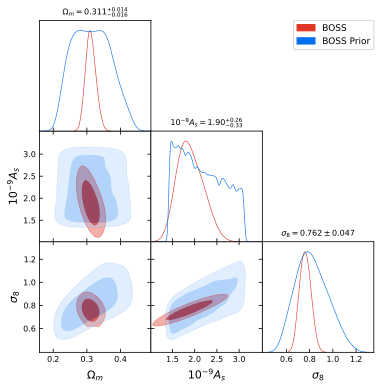

In [16]:
# Manually added derived parameters
g = plots.get_subplot_plotter(width_inch=6)
g.settings.alpha_filled_add = 0.3
g.triangle_plot([posterior, cosmo_prior], cosmo_prior.getParamNames().getDerivedNames(), title_limit=1, 
                filled=True,
                param_limits=prior.get_param_limits());

__'*Nuisance*' Parameters__\
`priorChain().get_nuisance_prior()` scans the input `.param` file and finds the EFT nuisance parameters' names (so that we can also take a look at their posterior distributions). It then computes their prior distributions in the same way as the 'cosmological' parameters.\
As explained in [Limits on $\omega$-CDM from the EFTofLSS with the PyBird code](https://arxiv.org/abs/2003.07956v2) by D'Amico et al., the only varying EFT parameters are $b_1$ and $c_2$: the others, appearing only linearly in the power spectrum, are marginalized over at the level of the likelihood; they showed that even with this marginalization one can recover EFT parameters' best fit values with good accuracy.\
It is possible to get their posterior distributions using PyBird's `Likelihood()` class.

In [17]:
nuisance_prior = prior.get_nuisance_prior(config_name='/boss_pk_wc')
nuisance_prior.name_tag = 'Nuisance Prior'

nuisance_names = prior.nuisance_names
g = plots.get_subplot_plotter(width_inch=9)
g.settings.alpha_filled_add = 0.3
g.triangle_plot([posterior, nuisance_prior], nuisance_names, title_limit=1,
                filled=True,
                param_limits=prior.get_param_limits());

Removed 0.3 as burn in
Fixed Parameter Limits: {'omega_b': (2.068, 2.468), 'omega_cdm': (0.08, 0.16), 'h': (0.635, 0.715), 'ln10^{10}A_s': (2.644, 3.444), 'n_s': (0.765, 1.165), 'b1_hN': (0.0, 4.0), 'c2_hN': (-10.0, 10.0), 'b1_hS': (0.0, 4.0), 'c2_hS': (-10.0, 10.0), 'b1_lN': (0.0, 4.0), 'c2_lN': (-10.0, 10.0), 'b1_lS': (0.0, 4.0), 'c2_lS': (-10.0, 10.0)}
